# Glass Bangle Defect Detection(다중 분류)

### 데이터 준비 : 드라이브 마운트 및 데이터 분리

In [2]:
# # 드라이브 마운트
# from google.colab import drive
# drive.mount('/content/drive')


# # 파일을 불러오기 위한 모듈
import os

In [3]:
# # 파일이 있는 경로로 이동
# %cd "/content/drive/MyDrive/deeplearning_project_ZB7"

# 경로 확인
os.getcwd()

'c:\\Users\\theo\\Documents\\deep_learning\\dl-project'

In [4]:
# 파일 확인
os.listdir()

['best_model.h5',
 'cnn_glass_bangle_defect_detection_epoch_15_with_adam_relu.h5',
 'cnn_glass_bangle_defect_detection_epoch_30_with_adam_swish.h5',
 'damaged_glass_bangle_classification.ipynb',
 'dataset',
 'dataset.zip',
 'dataset_binary',
 'image_classification_deeplearning_theo.ipynb',
 'image_classification_model.h5',
 'split_data',
 'split_data_binary',
 'theo_modified_binary.ipynb',
 'theo_modified_categorical.ipynb',
 'XAI_best_model.h5']

In [5]:
!pip install split-folders

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [5]:
# 파일 나누기
import splitfolders

original_dir = 'dataset'
classes_list = os.listdir(original_dir)

base_dir = './split_data'
# os.mkdir(base_dir)
# splitfolders.ratio(original_dir, output=base_dir, seed = 35, ratio=(.8,.1,.1))

In [6]:
# 원본 파일 확인
print('original/good :', len(os.listdir('dataset/good')))
print('original/broken :',len(os.listdir('dataset/broken')))
print('original/defect :',len(os.listdir('dataset/defect')))

original/good : 520
original/broken : 316
original/defect : 244


In [7]:
# train, validation, test로 나눠진 파일들 확인
print('train/good :', len(os.listdir('split_data/train/good')))
print('train/broken :',len(os.listdir('split_data/train/broken')))
print('train/defect :',len(os.listdir('split_data/train/defect')))
print('val/good :',len(os.listdir('split_data/val/good')))
print('val/broken :',len(os.listdir('split_data/val/broken')))
print('val/defect :',len(os.listdir('split_data/val/defect')))
print('test/good :',len(os.listdir('split_data/test/good')))
print('test/broken :',len(os.listdir('split_data/test/broken')))
print('test/defect :',len(os.listdir('split_data/test/defect')))

train/good : 416
train/broken : 252
train/defect : 195
val/good : 52
val/broken : 31
val/defect : 24
test/good : 52
test/broken : 33
test/defect : 25


### 데이터 준비 : 훈련 및 검증 데이터 경로 지정


In [8]:
# 경로 설정
train_dir = os.path.join(base_dir, 'train')
val_dir = os.path.join(base_dir, 'val')
test_dir = os.path.join(base_dir, 'test')

### 데이터 준비 : 이미지 데이터 전처리

In [9]:
# CUDA 적용 : 속도 이슈 해결
import torch

USE_CUDA = torch.cuda.is_available()
Device = torch.device('cuda' if USE_CUDA else 'cpu')

print(Device)

cuda


In [10]:
# 이미지 텐서화 작업
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder

transform_base = transforms.Compose([transforms.Resize((150,150)), transforms.ToTensor()])

train_dataset = ImageFolder(root='./split_data/train', transform=transform_base)
val_dataset = ImageFolder(root='./split_data/val', transform=transform_base)

In [11]:
# 이미지 데이터 최종 전처리
from tensorflow.keras.preprocessing.image import ImageDataGenerator


train_datagen = ImageDataGenerator( rescale = 1.0/255., 
                                    rotation_range=40,
                                    width_shift_range=0.2,
                                    height_shift_range=0.2,
                                    shear_range=0.2,
                                    zoom_range=0.2,
                                    horizontal_flip=True,
                                    fill_mode='nearest' )

test_datagen  = ImageDataGenerator( rescale = 1.0/255. )

train_generator = train_datagen.flow_from_directory(train_dir,
                                                  batch_size=16,
                                                  class_mode='categorical',
                                                  target_size=(150, 150))
validation_generator =  test_datagen.flow_from_directory(val_dir,
                                                       batch_size=16,
                                                       class_mode  = 'categorical',
                                                       target_size = (150, 150))

Found 863 images belonging to 3 classes.
Found 107 images belonging to 3 classes.


#### 모델 구성

In [18]:
# 모델 구성하기 : CNN
import tensorflow as tf


model = tf.keras.models.Sequential([
  tf.keras.layers.Conv2D(16, (3,3), activation='relu', input_shape=(150, 150, 3)),
  tf.keras.layers.MaxPooling2D(2,2),
  tf.keras.layers.Dropout(0.3),
  tf.keras.layers.Conv2D(32, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2,2),
  tf.keras.layers.Dropout(0.3),
  tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2,2),
  tf.keras.layers.Dropout(0.3),
  tf.keras.layers.Flatten(),
  tf.keras.layers.Dropout(0.3),
  tf.keras.layers.Dense(512, activation='relu'),
  tf.keras.layers.Dense(3, activation='softmax')
])

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 148, 148, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 74, 74, 16)       0         
 )                                                               
                                                                 
 dropout (Dropout)           (None, 74, 74, 16)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 72, 72, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 36, 36, 32)       0         
 2D)                                                             
                                                                 
 dropout_1 (Dropout)         (None, 36, 36, 32)        0

In [19]:
import tensorflow as tf

# 모델 컴파일하기
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
            loss='categorical_crossentropy',
            metrics=['accuracy'])

In [21]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# 콜백 함수
es = EarlyStopping(monitor="val_loss", verbose=1, patience=10)

# 최적의 모델을 자동 저장
mc = ModelCheckpoint("best_model_ver2.h5", monitor='val_accuracy', save_best_only=True, verbose=1)

In [22]:
# 모델 훈련하기
steps_per_epoch = 863 // 16
validation_steps = 107 // 16


hist = model.fit(train_generator,
                    validation_data=validation_generator,
                    steps_per_epoch=steps_per_epoch,
                    validation_steps=validation_steps,
                    epochs=50,
                    callbacks=[es, mc])

Epoch 1/50
53/53 [==============================] - ETA: 0s - loss: 2.0033 - accuracy: 0.4286
Epoch 00001: val_accuracy improved from -inf to 0.50000, saving model to best_model_ver2.h5
53/53 [==============================] - 66s 1s/step - loss: 2.0033 - accuracy: 0.4286 - val_loss: 1.0479 - val_accuracy: 0.5000
Epoch 2/50
53/53 [==============================] - ETA: 0s - loss: 1.0603 - accuracy: 0.4829
Epoch 00002: val_accuracy improved from 0.50000 to 0.52083, saving model to best_model_ver2.h5
53/53 [==============================] - 69s 1s/step - loss: 1.0603 - accuracy: 0.4829 - val_loss: 1.0642 - val_accuracy: 0.5208
Epoch 3/50
53/53 [==============================] - ETA: 0s - loss: 1.0432 - accuracy: 0.4852
Epoch 00003: val_accuracy did not improve from 0.52083
53/53 [==============================] - 68s 1s/step - loss: 1.0432 - accuracy: 0.4852 - val_loss: 1.0636 - val_accuracy: 0.4479
Epoch 4/50
53/53 [==============================] - ETA: 0s - loss: 1.0223 - accuracy: 0.

In [17]:
# 반복학습을 피하기 위한 모델 리셋용
tf.keras.backend.clear_session()

#### 모델 검증

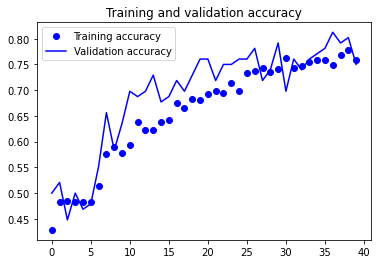

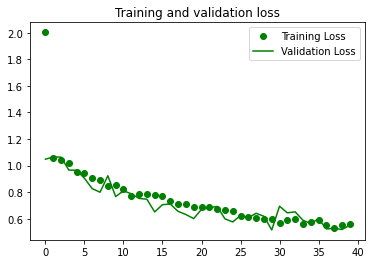

In [23]:
import matplotlib.pyplot as plt

acc = hist.history['accuracy']
val_acc = hist.history['val_accuracy']
loss = hist.history['loss']
val_loss = hist.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'bo', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'go', label='Training Loss')
plt.plot(epochs, val_loss, 'g', label='Validation Loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

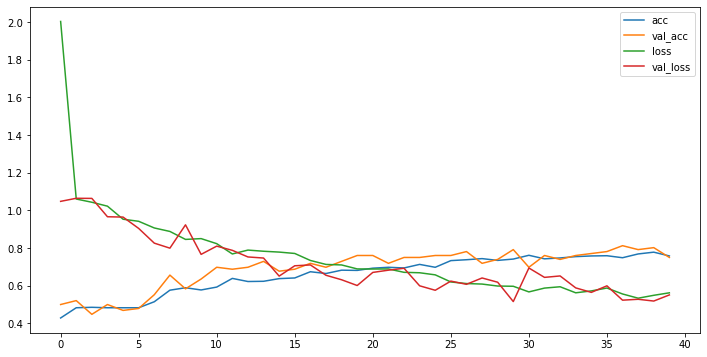

In [24]:
# 수치 비교
plt.figure(figsize=(12,6))
plt.plot(acc, label = 'acc')
plt.plot(val_acc, label = 'val_acc')
plt.plot(loss, label = 'loss')
plt.plot(val_loss, label = 'val_loss')
plt.legend()
plt.show()

In [30]:
from keras.models import load_model

# 모델 불러오기
model = load_model('best_model_ver2.h5')

#### 모델 평가

In [ ]:
# 테스트 데이터 전처리
test_datagen  = ImageDataGenerator( rescale = 1.0/255. )

test_generator =  test_datagen.flow_from_directory(test_dir,
                                                  batch_size = 16,
                                                  class_mode  = 'categorical',
                                                  target_size = (150, 150))

In [32]:
scores = model.evaluate(test_generator, steps = 110 // 16)

print('%s : %.2f%%'%(model.metrics_names[1], scores[1]*100))

6/6 [==============================] - 7s 1s/step - loss: 0.5925 - accuracy: 0.7500
accuracy : 75.00%


## 모델 준비 완료 --> saliency 적용

In [60]:
!pip install saliency

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.2/86.2 KB 3.0 MB/s eta 0:00:00


#### Saliency 모델의 output과 input 사이의 gradient 연산 처리

In [33]:
import saliency.core as saliency
import tensorflow as tf
import numpy as np

def model_fn(images, call_model_args, expected_keys=None):
 
    target_class_idx = call_model_args['class']
    model = call_model_args['model']
    images = tf.convert_to_tensor(images)

    with tf.GradientTape() as tape:
        if expected_keys==[saliency.base.INPUT_OUTPUT_GRADIENTS]:
            tape.watch(images)
            output = model(images)
            output = output[:,target_class_idx]
            gradients = np.array(tape.gradient(output, images))
            return {saliency.base.INPUT_OUTPUT_GRADIENTS: gradients}
        else:
            conv, output = model(images)
            gradients = np.array(tape.gradient(output, conv))
            return {saliency.base.CONVOLUTION_LAYER_VALUES: conv,
                    saliency.base.CONVOLUTION_OUTPUT_GRADIENTS: gradients}

####   Saliency map을 이용하여 기여도 맵 추출 함수

In [34]:
def vanilla_saliency(model, img):
    """
    :model: 학습된 인공지능 모델
            인공지능 모델이 바뀔 때, 기여도 맵 또한 변경됨.
    :img:   기여도 맵을 추출하고 하는 이미지 데이터
    :return: 추출된 기여도 맵

    """
    pred = model(np.array([img]))
    pred_cls = np.argmax(pred[0])
    args = {'model': model, 'class': pred_cls}

    grad = saliency.GradientSaliency()
    attr = grad.GetMask(img, model_fn, args)
    attr = saliency.VisualizeImageGrayscale(attr)
    
    return tf.reshape(attr, (*attr.shape, 1))

def ig(model, img):
    pred = model(np.array([img]))
    pred_cls = np.argmax(pred[0])
    args = {'model': model, 'class': pred_cls}

    baseline = np.zeros(img.shape)
    ig = saliency.IntegratedGradients()
    attr = ig.GetMask(img, model_fn, args, x_steps=25, x_baseline=baseline, batch_size=20)
    attr = saliency.VisualizeImageGrayscale(attr)

    return tf.reshape(attr, (*attr.shape, 1))

def smooth_saliency(model, img):
    pred = model(np.array([img]))
    pred_cls = np.argmax(pred[0])
    args = {'model': model, 'class': pred_cls}

    smooth_grad = saliency.GradientSaliency()
    smooth_attr = smooth_grad.GetSmoothedMask(img, model_fn, args)
    smooth_attr = saliency.VisualizeImageGrayscale(smooth_attr)

    return tf.reshape(smooth_attr, (*smooth_attr.shape, 1))

def smooth_ig(model, img):

    pred = model(np.array([img]))
    pred_cls = np.argmax(pred[0])
    args = {'model': model, 'class': pred_cls}

    baseline = np.zeros(img.shape)
    smooth_ig = saliency.IntegratedGradients()

    smooth_attr = smooth_ig.GetSmoothedMask(
        img, model_fn, args, x_steps=25, x_baseline=baseline, batch_size=20)

    smooth_attr = saliency.VisualizeImageGrayscale(smooth_attr)

    return tf.reshape(smooth_attr, (*smooth_attr.shape, 1))

#### sample data 시각화: 분류 라벨별('good' or 'broken' or 'defect')

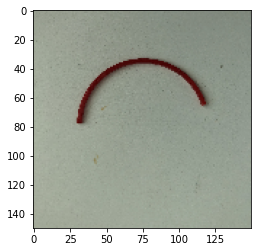

In [126]:
# sample data 시각화 : broken 이미지

import matplotlib.pyplot as plt

plt.imshow(x_val[4])

In [127]:
sample_image = x_val[4]
sample_saliency_xai_image = vanilla_saliency(model, x_val[4])
sample_ig_xai_image = ig(model, x_val[4])

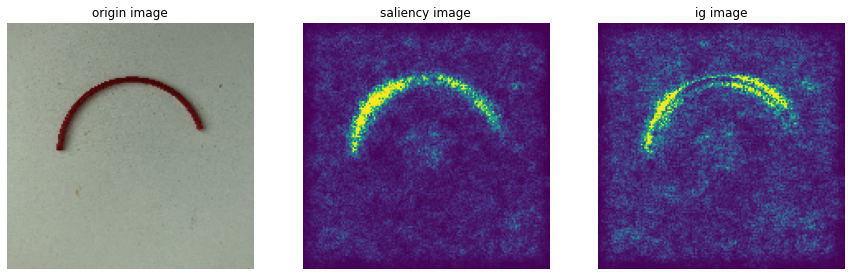

In [128]:
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(np.reshape(sample_image, (150, 150, 3)))
plt.title("origin image")
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(np.reshape(sample_saliency_xai_image, (150, 150)))
plt.title("saliency image")
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(np.reshape(sample_ig_xai_image, (150, 150)))
plt.title("ig image")
plt.axis('off')

plt.show()

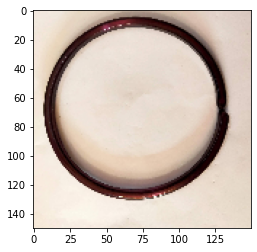

In [152]:
# sample data 시각화 : defect 이미지

plt.imshow(x_val[13])

In [153]:
sample_image = x_val[13]
sample_saliency_xai_image = vanilla_saliency(model, x_val[13])
sample_ig_xai_image = ig(model, x_val[13])

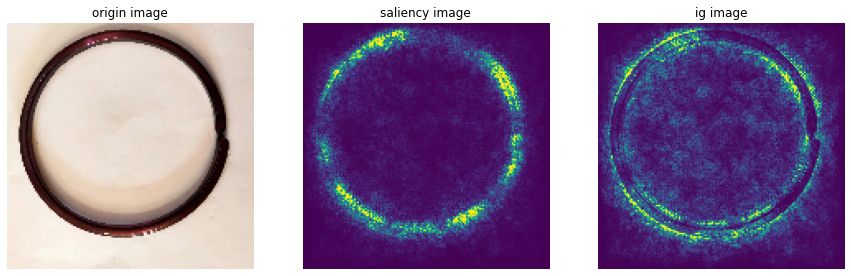

In [154]:
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(np.reshape(sample_image, (150, 150, 3)))
plt.title("origin image")
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(np.reshape(sample_saliency_xai_image, (150, 150)))
plt.title("saliency image")
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(np.reshape(sample_ig_xai_image, (150, 150)))
plt.title("ig image")
plt.axis('off')

plt.show()

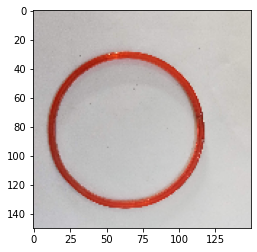

In [164]:
# sample data 시각화 : good 이미지

plt.imshow(x_val[21])

In [165]:
sample_image = x_val[21]
sample_saliency_xai_image = vanilla_saliency(model, x_val[21])
sample_ig_xai_image = ig(model, x_val[21])

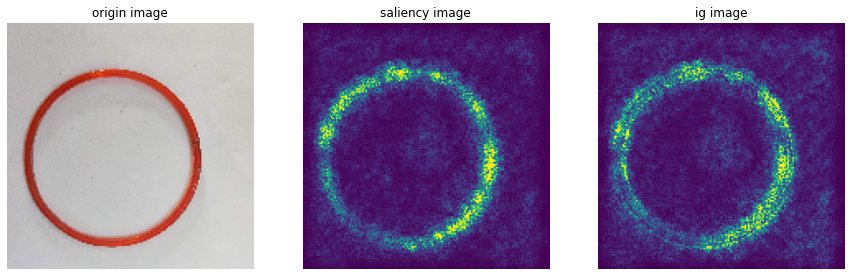

In [166]:
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(np.reshape(sample_image, (150, 150, 3)))
plt.title("origin image")
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(np.reshape(sample_saliency_xai_image, (150, 150)))
plt.title("saliency image")
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(np.reshape(sample_ig_xai_image, (150, 150)))
plt.title("ig image")
plt.axis('off')

plt.show()

## XAI형태로 데이터 추출

- 1. validation_generator, train_generator 안에 있는 모든 데이터들을 이어서 학습
- 2. 모든 데이터를 잇는 방식은 batch로 처리하는 방식에 비해서 속도 측면에서 비효율적
- 3. 따라서 모델을 상정하고 generator에서 batch를 반복적으로 추출
- 4. 각각의 batch를 차례대로 ig 처리해서 model에 순차적으로 학습

In [38]:
# 두 데이터 모두 batch size를 16개로 다시 전처리

train_datagen = ImageDataGenerator( rescale = 1.0/255. )


train_generator = train_datagen.flow_from_directory(train_dir,
                                                  batch_size=16,
                                                  class_mode='categorical',
                                                  target_size=(150, 150))
validation_generator =  train_datagen.flow_from_directory(val_dir,
                                                       batch_size=16,
                                                       class_mode  = 'categorical',
                                                       target_size = (150, 150))

test_generator =  train_datagen.flow_from_directory(test_dir,
                                                       batch_size=16,
                                                       class_mode  = 'categorical',
                                                       target_size = (150, 150))

Found 863 images belonging to 3 classes.
Found 107 images belonging to 3 classes.
Found 110 images belonging to 3 classes.


In [40]:
iterators_1 = iter(train_generator)
iterators_2 = iter(validation_generator)
iterators_3 = iter(test_generator)

cnt = 0
while True:
  x, y = next(iterators_1)
  z = len(x)
  cnt += 1
  if cnt == 1:
    X_train = x
    y_train = y
  else:
    X_train = np.concatenate((X_train, x), axis=0)
    y_train = np.concatenate((y_train, y), axis=0)
  if z == 863 % 16:
    break
while True:
  x, y = next(iterators_2)
  z = len(x)
  X_train = np.concatenate((X_train, x), axis=0)
  y_train = np.concatenate((y_train, y), axis=0)
  if z == 107 % 16:
    break
cnt = 0
while True:
  x, y = next(iterators_3)
  z = len(x)
  cnt += 1
  if cnt == 1:
    X_val = x
    y_val = y
  else:
    X_val = np.concatenate((X_val, x), axis=0)
    y_val = np.concatenate((y_val, y), axis=0)
  if z == 110 % 16:
    break
ig_x_train = np.zeros_like(X_train)
ig_x_test = np.zeros_like(X_val)

for i in range(len(ig_x_train)):
    ig_x_train[i] = ig(model, X_train[i])

for i in range(len(ig_x_test)):
    ig_x_test[i] = ig(model, X_val[i])

#### XAI 추출 데이터 모델 생성

In [45]:
new_model = tf.keras.models.Sequential([
  tf.keras.layers.Conv2D(16, (3,3), activation='relu', input_shape=(150, 150, 3)),
  tf.keras.layers.MaxPooling2D(2,2),
  tf.keras.layers.Dropout(0.3),
  tf.keras.layers.Conv2D(32, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2,2),
  tf.keras.layers.Dropout(0.3),
  tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2,2),
  tf.keras.layers.Dropout(0.3),
  tf.keras.layers.Flatten(),
  tf.keras.layers.Dropout(0.3),
  tf.keras.layers.Dense(512, activation='relu'),
  tf.keras.layers.Dense(3, activation='softmax')
])

new_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
                  loss='categorical_crossentropy',
                  metrics = ['accuracy'])

new_model.fit(ig_x_train, y_train, epochs=30, shuffle=True)

Epoch 1/30
31/31 [==============================] - 6s 144ms/step - loss: 0.9805 - accuracy: 0.5567
Epoch 2/30
31/31 [==============================] - 4s 127ms/step - loss: 0.7443 - accuracy: 0.6897
Epoch 3/30
31/31 [==============================] - 4s 128ms/step - loss: 0.6146 - accuracy: 0.7443
Epoch 4/30
31/31 [==============================] - 4s 127ms/step - loss: 0.5413 - accuracy: 0.7814
Epoch 5/30
31/31 [==============================] - 4s 128ms/step - loss: 0.4548 - accuracy: 0.8175
Epoch 6/30
31/31 [==============================] - 4s 127ms/step - loss: 0.3890 - accuracy: 0.8402
Epoch 7/30
31/31 [==============================] - 4s 128ms/step - loss: 0.3484 - accuracy: 0.8577
Epoch 8/30
31/31 [==============================] - 4s 127ms/step - loss: 0.3066 - accuracy: 0.8732
Epoch 9/30
31/31 [==============================] - 4s 127ms/step - loss: 0.2545 - accuracy: 0.9010
Epoch 10/30
31/31 [==============================] - 4s 127ms/step - loss: 0.1987 - accuracy: 0.9206

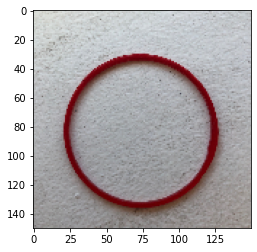

In [65]:
plt.imshow(X_val[0])

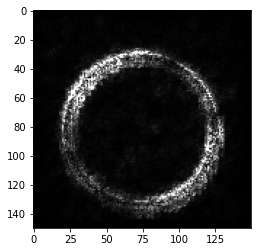

In [66]:
plt.imshow(ig_x_test[0])

In [179]:
# 모델 불러오기

new_model = load_model('XAI_best_model.h5')

#### 예측이 틀린 데이터 추출

In [46]:
# x, y = next(iter(test_generator)) # next를 실행하면 다시 shuffle 됨
print(ig_x_test[0].shape,len(ig_x_test))

predictions = new_model.predict(ig_x_test)
predictions = np.round(predictions).astype('float')

# 틀린 친구들의 인덱스 도출
# incorrect_idx = np.where(predictions != y_val)[0]
# print('예측 틀린 데이터 수 : ',len(incorrect_idx))

incorrect_idx = []

for i in range(len(ig_x_test)):
    cnt = 0
    while cnt < 3:
        if predictions[i][cnt] == 1:
            predictions_idx = cnt
        if y_val[i][cnt] == 1:
            y_val_idx = cnt
        cnt += 1
    
    if predictions_idx != y_val_idx:
        incorrect_idx.append(i)

print('예측 틀린 데이터 수 : ',len(incorrect_idx))
print('테스트 성능 : ', (110 - len(incorrect_idx)) / 110 * 100)

(150, 150, 3) 110
예측 틀린 데이터 수 :  29
테스트 성능 :  73.63636363636363


In [47]:
# 틀린 데이터 이미지와 레이블을 가지고 오기

incorrect_images = []
incorrect_labels = []
correct_labels=[]

for i in incorrect_idx:
    incorrect_images.append(X_val[i])
    incorrect_labels.append(predictions[i])
    correct_labels.append(y_val[i])

incorrect_images = np.array(incorrect_images)
incorrect_labels = np.array(incorrect_labels)
correct_labels = np.array(correct_labels)

ValueError: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()

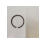

In [250]:
# 틀린 데이터 이미지 조회

for i, (img, label) in enumerate(zip(incorrect_images, incorrect_labels)):
    plt.subplot(2, 9, i + 1)
    plt.imshow(img)
    plt.axis("off")
    if label == 1:
        plt.title("Label: Broken")
    else:
        plt.title("Label: Good")

plt.tight_layout()
plt.show()

---

### XAI: LIME

In [ ]:
pip install lime

     -------------------------------------- 275.7/275.7 kB 8.6 MB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
Note: you may need to restart the kernel to use updated packages.Requirement already satisfied: matplotlib in c:\users\theo\miniconda3\envs\ds_study\lib\site-packages (from lime) (3.5.2)



  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283839 sha256=77181b2177b58b887de195ce0cd657cc0747fc013d0fe1e10679204fc8f492fc
  Stored in directory: c:\users\theo\appdata\local\pip\cache\wheels\ef\f5\11\572c4d43760b43708e7ddb4b401a01742dcb4299a0aa385023
Successfully built lime


In [ ]:
from lime import lime_image
from lime.wrappers.scikit_image import SegmentationAlgorithm

explainer = lime_image.LimeImageExplainer()

In [ ]:
# 이미지를 슈퍼픽셀로 분할하는 알고리즘 설정
# quickshift, slic, felzenswalb 등이 존재
segmenter = SegmentationAlgorithm('slic',
                                   n_segments=100, # 이미지 분할 조각 개수
                                   compactnes=1, # 유사한 파트를 합치는 함수
                                   sigma=1) # 스무딩 역할: 0과 1사이의 float

In [ ]:
olivetti_test_index = 0

X_test, y_test = next(iter(test_generator))

exp = explainer.explain_instance(X_test[olivetti_test_index],
                                classifier_fn=model.predict, # 40개 class 확률 반환
                                top_labels=1, # 확률 기준 1~5위
                                num_samples=1000, # sample space
                                segmentation_fn=segmenter) # 분할 알고리즘

  0%|          | 0/1000 [00:00<?, ?it/s]

Text(0.5, 1.0, 'Show mask only')

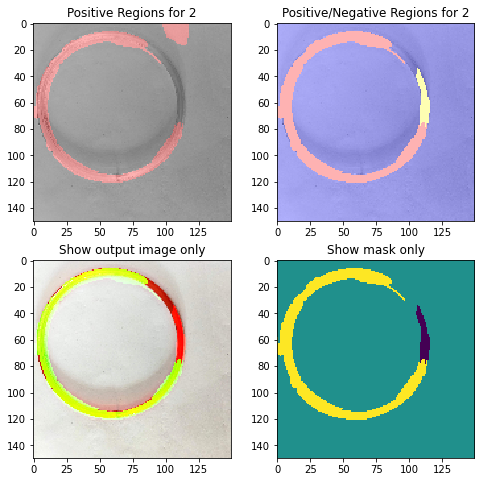

In [ ]:
# sklearn의 regressor 기본 설명 모델로 사용

from skimage.color import label2rgb

y_test_num = b


# 캔버스
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(8, 8))
ax = [ax1, ax2, ax3, ax4]
for i in ax:
    i.grid(False)
    
# 모든 세그먼트 출력
temp, mask = exp.get_image_and_mask(y_test_num[0],
                                 positive_only=False, # 설명 모델이 결과값을 가장 잘 설명하는 이미지 영역만 출력
                                 num_features=8, # 분할 영역의 크기
                                 hide_rest=False) # 이미지를 분류하는 데 도움이 되는 서브모듈 외의 모듈도 출력


# 이미지만 출력
ax3.imshow(temp, interpolation='nearest')
ax3.set_title('Show output image only')


---

### XAI: Grad-CAM

In [275]:
!pip install grad-cam

     ---------------------------------------- 7.8/7.8 MB 33.2 MB/s eta 0:00:00
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
  Preparing metadata (pyproject.toml): started
  Preparing metadata (pyproject.toml): finished with status 'done'


  Created wheel for grad-cam: filename=grad_cam-1.4.6-py3-none-any.whl size=38295 sha256=e8fb1fb301962b259ae4e91a08c7bf0f11e7e15b5a54bb237e6b83ef00cc88a5
  Stored in directory: c:\users\theo\appdata\local\pip\cache\wheels\00\30\f4\28df830dda542c9bf3316913d388efbe96904137b45383ad94
Successfully built grad-cam


In [48]:
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from PIL import Image
import tensorflow as tf
from tensorflow import keras

In [49]:
def grad_cam(img_array,model,last_conv_layer_name,pred_index=None):
  # 마지막 feature maps과 최종 예측값을 구하는 모델 새로 정의
  grad_model=tf.keras.models.Model([model.inputs],[model.get_layer(last_conv_layer_name).output,model.output])
  
  # 마지막 feature maps과 최종 예측값을 구하는 과정을 저장한다. 미분하기 위해 필요
  with tf.GradientTape() as tape:
    last_conv_layer_output, preds=grad_model(img_array)
    if pred_index is None:
      pred_index=tf.argmax(preds[0])
    class_channel=preds[:,pred_index]

  #  미분 계산
  grads=tape.gradient(class_channel,last_conv_layer_output)
  
  # 마지막 feature maps는 여러개의 채널을 갖고 이씩 때문에 각 채널마다 등장한 미분값들을 평균(채널의 중요도 결정)
  pooled_grads=tf.reduce_mean(grads, axis=(0,1,2))

  # 채널의 중요도를 가중치로 가중합을 해줌으로써 어떤 위치가 중요한지 결정([높이,너비,1]가 됨)
  last_conv_layer_output=last_conv_layer_output[0]

  # @는 행렬곱 연산. 축을 잘 맞춰줌으로써 행렬곱 = 가중합 연산
  heatmap=last_conv_layer_output @ pooled_grads[...,tf.newaxis] #tf.newaxis : 한 차원 늘리기 / ...:확장 슬라이싱? pass처럼 사용 가능
  heatmap=tf.squeeze(heatmap) # 축 없애기 ([높이,너비,1] -> [높이,너비])

  # 0과 1 사이 값으로 만들기
  heatmap=tf.maximum(heatmap,0) / tf.math.reduce_max(heatmap)
  return heatmap.numpy()

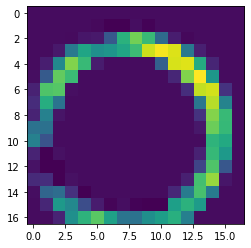

In [71]:
heatmap=grad_cam(incorrect_images[0:1],model,'max_pooling2d_2')
plt.imshow(heatmap)
plt.show()

#### 시각화 함수 구현

In [50]:
from lime import lime_image
from lime.wrappers.scikit_image import SegmentationAlgorithm

def display_gradcam_with_img(img,heatmap,alpha=0.4):
  # 0과 1 사이 값을 갖는 행렬 -> 0과 255 사이의 정수를 갖는 행렬로 변환
  heatmap=np.uint8(255*heatmap)

  # 칼라맵 설정
  jet=cm.get_cmap('jet')
  jet_colors=jet(np.arange(256))[:,:3]

  # 0~255에 대응하는 RGB값 불러오기 [256,3]
  jet_heatmap=jet_colors[heatmap] # RGB 이미지가 됨

  # 행렬을 이미지로 바꿔주기
  jet_heatmap=keras.preprocessing.image.array_to_img(jet_heatmap)

  # 히트맵 사이즈를 이미지 크기로 바꾸기
  jet_heatmap=jet_heatmap.resize((img.shape[1],img.shape[0]))

  # 이미지를 행렬로 바꾸기
  jet_heatmap=keras.preprocessing.image.img_to_array(jet_heatmap)

  # 히트맵과 이미지 겹치기
  superimposed_img=jet_heatmap*alpha+img

  superimposed_img=np.uint8(superimposed_img)

  # Saliency 이미지
  sample_saliency_xai_image = vanilla_saliency(model, img / 255) # grad-cam에서 255 곱해줘서 다시 나눠줌
  sample_ig_xai_image = ig(model, img / 255)                     # grad-cam에서 255 곱해줘서 다시 나눠줌


  # 이미지를 슈퍼픽셀로 분할하는 알고리즘 설정
  # quickshift, slic, felzenswalb 등이 존재
  # X_test, y_test = next(iter(test_generator))
  explainer = lime_image.LimeImageExplainer()
  segmenter = SegmentationAlgorithm('slic',
                                    n_segments=100, # 이미지 분할 조각 개수
                                    compactnes=1, # 유사한 파트를 합치는 함수
                                    sigma=1) # 스무딩 역할: 0과 1사이의 float
  exp = explainer.explain_instance(img / 255,
                                  classifier_fn=model.predict, # 40개 class 확률 반환
                                  top_labels=3, # 확률 기준 1~5위
                                  num_samples=100, # sample space
                                  segmentation_fn=segmenter) # 분할 알고리즘
  # 모든 세그먼트 출력
  temp, mask = exp.get_image_and_mask(np.argmax(label),
                                  positive_only=False, # 설명 모델이 결과값을 가장 잘 설명하는 이미지 영역만 출력
                                  num_features=8, # 분할 영역의 크기
                                  hide_rest=False) # 이미지를 분류하는 데 도움이 되는 서브모듈 외의 모듈도 출력
  
  return img,temp,superimposed_img,sample_saliency_xai_image,sample_ig_xai_image


#### 시각화 함수 실행

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

<ipython-input-51-689a5dd33b6a>:24: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes=plt.subplots(1,5,figsize=(21,7))


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

<Figure size 1500x1500 with 0 Axes>

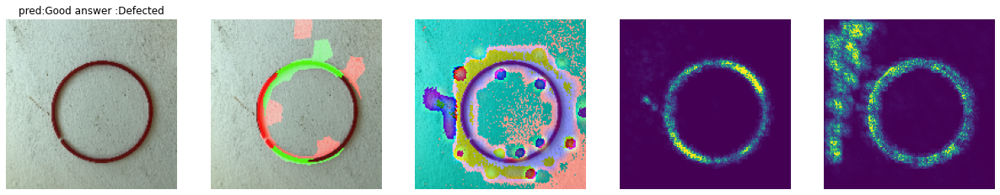

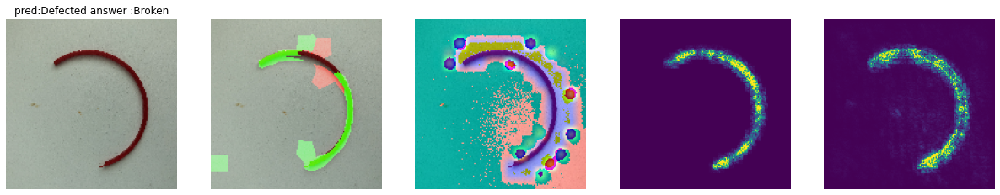

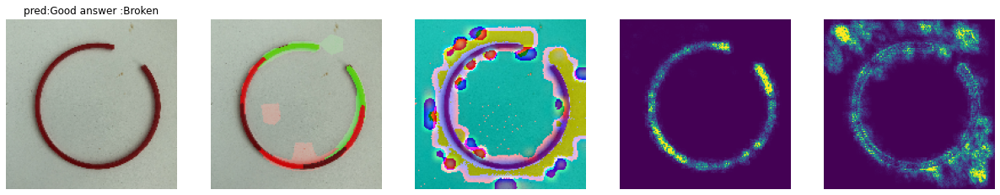

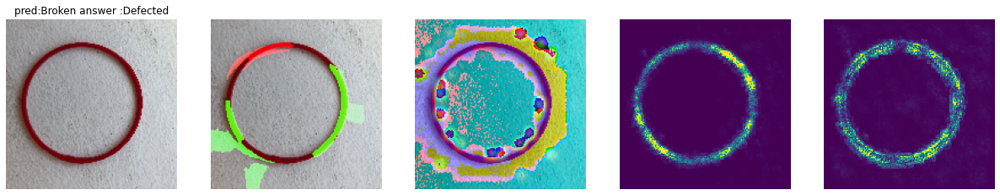

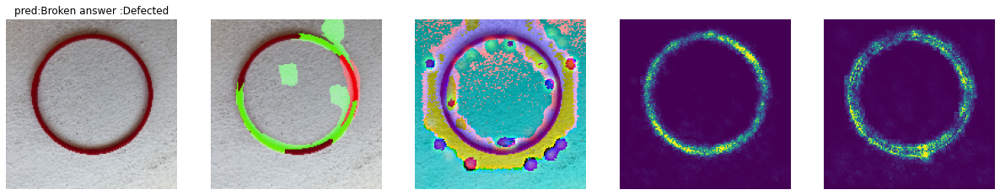

...

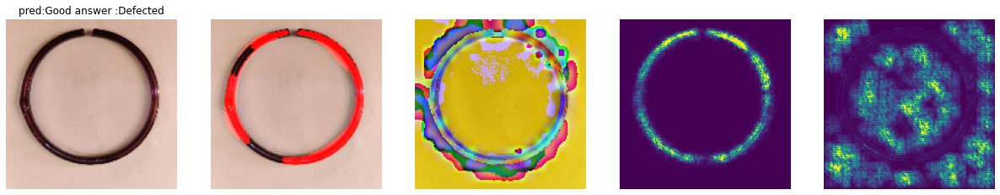

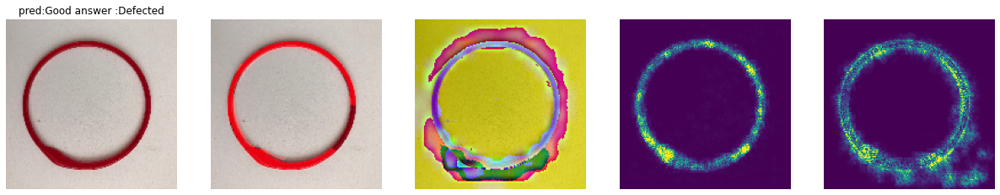

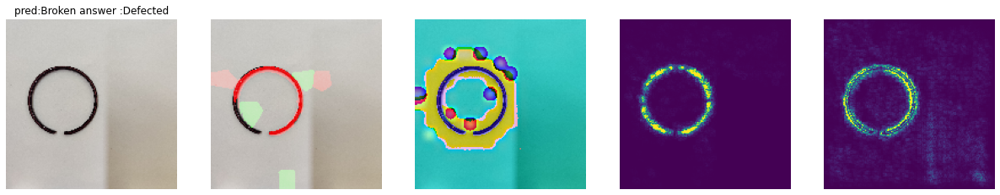

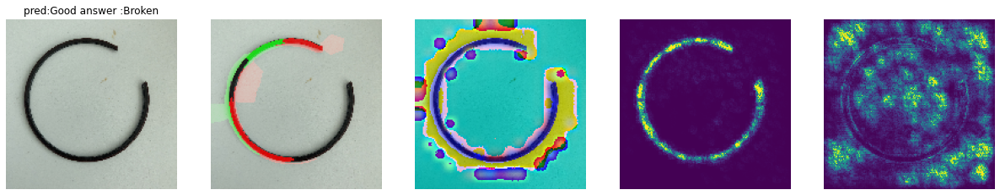

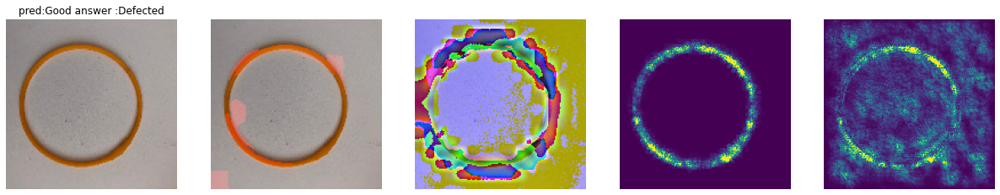

In [51]:
plt.figure(figsize=(15, 15), dpi=100)
# 반복문을 통해 이미지를 추가해 전체 보이기
for i, (img, label) in enumerate(zip(incorrect_images, incorrect_labels)):
    heatmap=grad_cam(img[np.newaxis],model,'max_pooling2d_2')
    original_img,temp,superimposed_img,sample_saliency_xai_image,sample_ig_xai_image = display_gradcam_with_img(img*255,heatmap,alpha=0.8)

    # 정답 라벨
    if correct_labels[i][0]==1:
        ans='Broken'
    elif correct_labels[i][1]==1:
        ans='Defected'
    elif correct_labels[i][2]==1:
        ans='Good'

    # 예측 라벨
    if label[0]==1:
        pred='Broken'
    elif label[1]==1:
        pred='Defected'
    elif label[2]==1:
        pred='Good'

     # 시각화
    fig, axes=plt.subplots(1,5,figsize=(21,7))
    axes[0].imshow(img) # 원본 이미지
    axes[1].imshow(temp) #히트맵
    axes[2].imshow(superimposed_img) # 원본 + 히트맵
    axes[3].imshow(sample_saliency_xai_image)
    axes[4].imshow(sample_ig_xai_image)

    axes[0].set_title(f'pred:{pred} answer :{ans}')

    for ax in axes:
        ax.axis('off') #축 눈금이랑 숫자 없애기